In [ ]:
#| default_exp datasets.manifolds
from nbdev.showdoc import *
import numpy as np
from tqdm.notebook import trange, tqdm
import matplotlib.pyplot as plt
import torch
import torch_geometric
from FEARFRED.plotting import plot_directed_2d, plot_directed_3d
%load_ext autoreload
%autoreload 2

# Manifold Datasets
> Circles, spirals, double helixes, available both as point & flow data and as datasets of directed graphs

# 2d Toy Manifolds

We first introduce two useful helper functions. The first function tilts the 1-manifold in 2d plane into 3d space. The second function adds noise to data positions.

In [ ]:
#| export
# Tilt 2d plane into 3d space
import numpy as np
def xy_tilt(X, flows, xtilt=0, ytilt=0):
    xrotate = np.array([[1,              0,             0],
                        [0,  np.cos(xtilt), np.sin(xtilt)],
                        [0, -np.sin(xtilt), np.cos(xtilt)]])
    yrotate = np.array([[np.cos(ytilt), 0, -np.sin(ytilt)],
                        [            0, 1,              0],
                        [np.sin(ytilt), 0,  np.cos(ytilt)]])
    X = X @ xrotate @ yrotate
    flows = flows @ xrotate @ yrotate
    return X, flows

In [ ]:
#| export
def rotation_transform(
    X : np.ndarray, # The input matrix, of size n x d (d is # dimensions)
    tilt_angles # a list of d-1 values in [0,2pi] specifying how much to tilt in d-1 the xy, yz (...) planes
):
    # Tilt matrix into arbitrary dimensions
    d = len(X)
    assert len(tilt_angles) == d - 1
    # construct Tilting Matrices TM!
    tilting_matrices_tm = []
    for i in range(d-1):
        A = np.eye(d)
        A[i][i] = np.cos(tilt_angles[i])
        A[i+1][i+1] = np.cos(tilt_angles[i])
        A[i][i+1] = np.sin(tilt_angles[i])
        A[i+1][i] = - np.sin(tilt_angles[i])
        tilting_matrices_tm.append(A)
    X_tilted = X
    for tilter in tilting_matrices_tm:
        # print(X_tilted)
        X_tilted = X_tilted @ tilter
    return X_tilted, tilting_matrices_tm

In [ ]:
#| export
def add_noise(X, sigma=0):
    return X + np.random.normal(0, sigma, X.shape)

## Circles

We sample $\theta$ uniformly between $0$ and $2\pi$ and calculate $x = r\cos(\theta), y = r\sin(\theta)$. The vector at each data point is tangent to the circle.

In [ ]:
#| export
def directed_circle(num_nodes=500, radius=1, xtilt=0, ytilt=0, sigma=0, inverse=False):
    """
    Sample `n` data points on a circle.
    In addition to the points, returns a "flow" vector at each point. 

    Parameters
    -----------
    num_nodes : int, default=500
        Number of data points in shape.
    radius : float, default=1
        Radius of circle.

    xtilt : float, default=0
        Angle to rotate around the x-axis.
    ytilt : float, default=0
        Angle to rotate around the y-axis.
    sigma : float, default=0
        Amount of gaussian noise
    inverse : bool, default=False
        Whether to flip the direction of flow
    """
    # sample random angles between 0 and 2pi
    thetas = np.random.uniform(0, 2*np.pi, num_nodes)
    thetas = np.sort(thetas)
    labels = thetas
    # calculate x and y coordinates
    x = np.cos(thetas) * radius
    y = np.sin(thetas) * radius
    z = np.zeros(num_nodes)
    X = np.column_stack((x, y, z))
    # calculate the angle of the tangent
    alphas = thetas + np.pi/2
    # calculate the coordinates of the tangent
    u = np.cos(alphas)
    v = np.sin(alphas)
    w = np.zeros(num_nodes)
    flows = np.column_stack((u, v, w))
    flows = -flows if inverse else flows
    # tilt and add noise
    X, flows = xy_tilt(X, flows, xtilt, ytilt)
    X = add_noise(X, sigma)
    return X, flows, labels

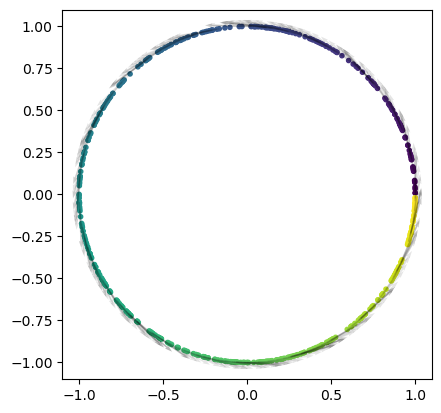

In [ ]:
# collapse
X, flows, labels = directed_circle()
plot_directed_2d(X, flows, labels)

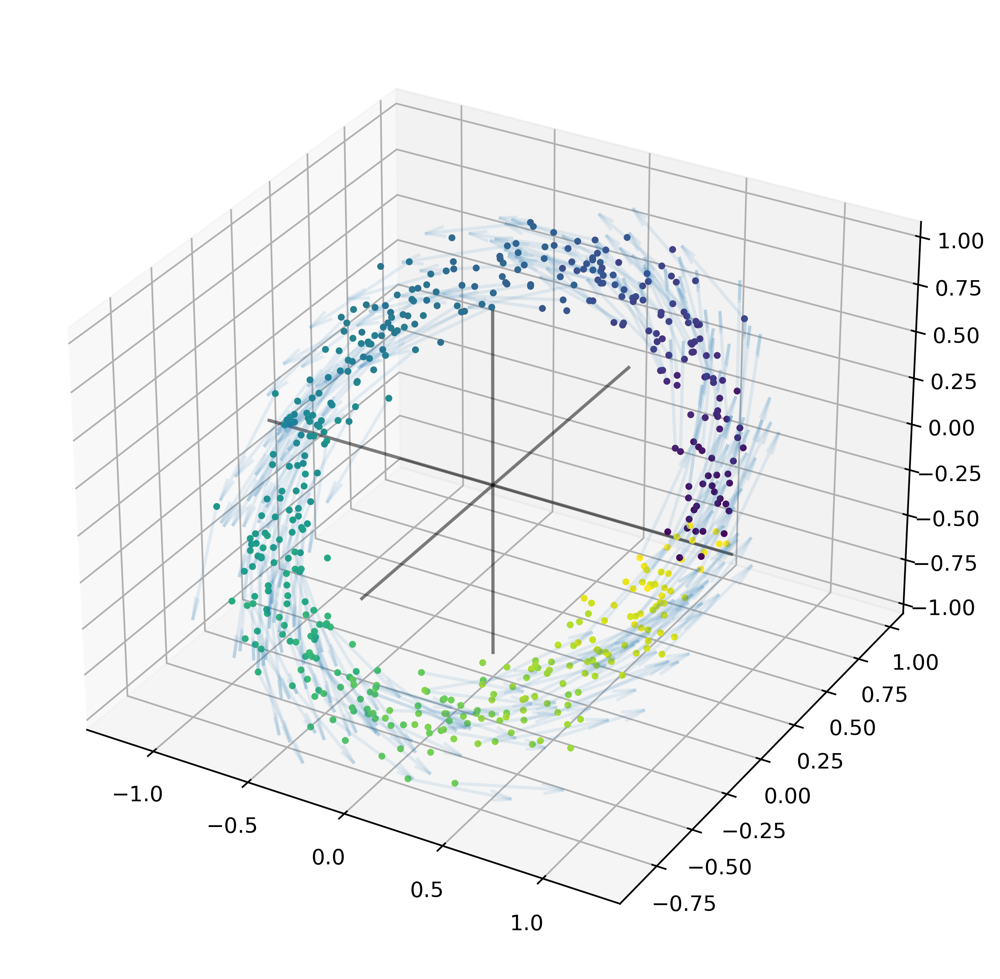

In [ ]:
# collapse
X, flows, labels = directed_circle(xtilt=np.pi/4, sigma=0.1)
plot_directed_3d(X, flows, labels, origin=True)

## Naive Spirals

We sample $\theta$ uniformly between $0$ and $2\pi \times$ `num_spirals` and calculate $x = r\theta\cos(\theta), y = r\theta\sin(\theta)$. The vector at each data point is tangent to the spiral and its length is proportional to $\theta$.

In [ ]:
#| export
def directed_spiral(num_nodes=500, num_spirals=1.5, radius=1, xtilt=0, ytilt=0, sigma=0, inverse=False):
    """
    Sample `n` data points on a spiral.
    In addition to the points, returns a "flow" vector at each point. 

    Parameters
    -----------
    num_nodes : int, default=500
        Number of data points in shape.
    num_spirals : float, default=1.5
        Number of revolution.
    radius : float, default=1
        Radius of spiral.

    xtilt : float, default=0
        Angle to rotate around the x-axis.
    ytilt : float, default=0
        Angle to rotate around the y-axis.
    sigma : float, default=0
        Amount of gaussian noise
    inverse : bool, default=False
        Whether to flip the direction of flow
    """
    # sample random angles between 0 and num_spirals * 2pi
    thetas = np.random.uniform(0, num_spirals*2*np.pi, num_nodes)
    thetas = np.sort(thetas)
    labels = thetas
    # calculate x and y coordinates
    x = np.cos(thetas) * thetas * radius
    y = np.sin(thetas) * thetas * radius
    z = np.zeros(num_nodes)
    X = np.column_stack((x, y, z))
    # calculate the angle of the tangent
    alphas = thetas + np.pi/2
    # calculate the coordinates of the tangent
    u = np.cos(alphas) * thetas
    v = np.sin(alphas) * thetas
    w = np.zeros(num_nodes)
    flows = np.column_stack((u, v, w))
    flows = -flows if inverse else flows
    # tilt and add noise
    X, flows = xy_tilt(X, flows, xtilt, ytilt)
    X = add_noise(X, sigma)
    return X, flows, labels

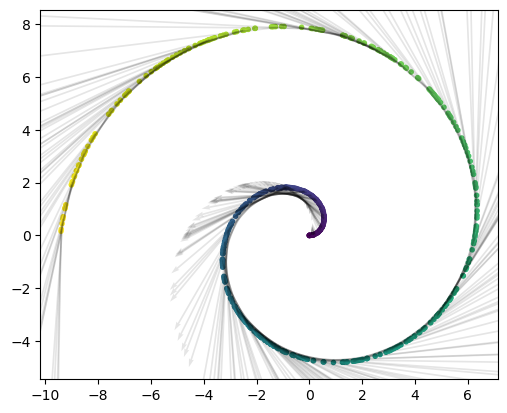

In [ ]:
X, flows, labels = directed_spiral()
plot_directed_2d(X, flows, labels)

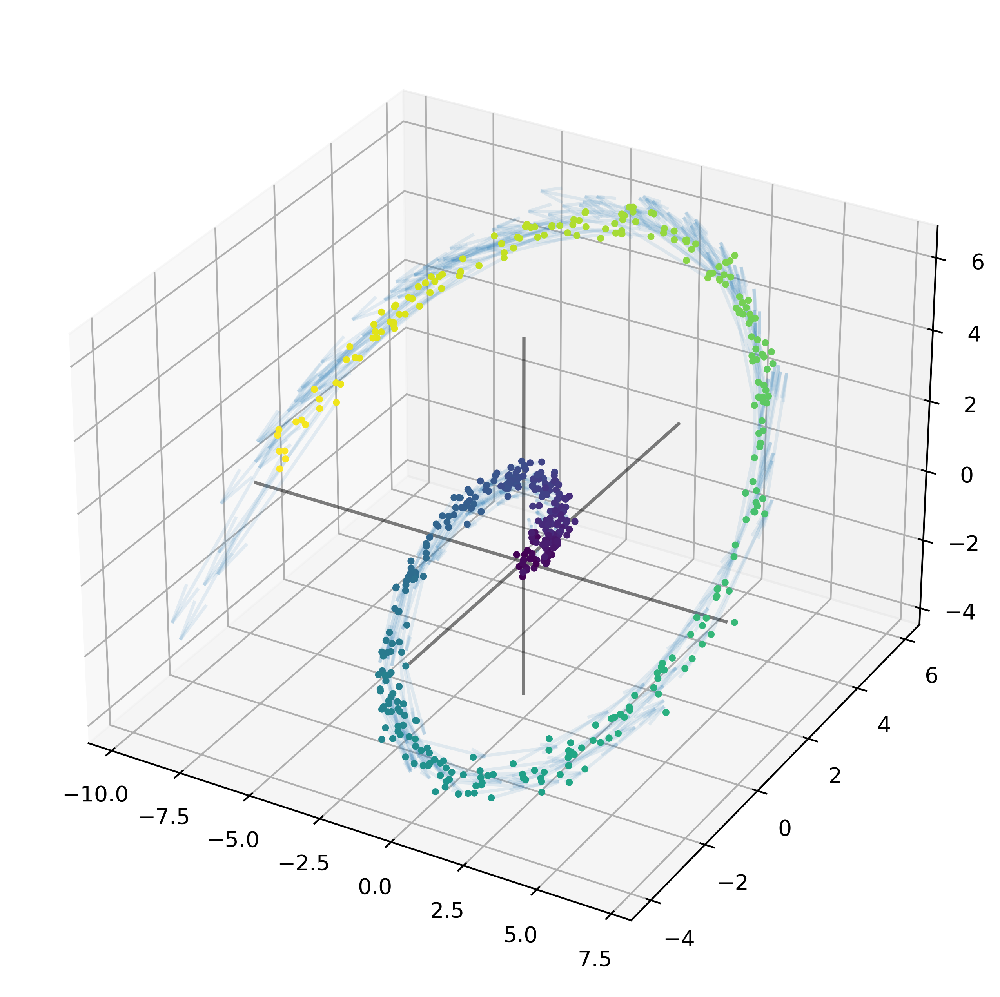

In [ ]:
X, flows, labels = directed_spiral(xtilt=np.pi/4, sigma=0.2)
plot_directed_3d(X, flows, labels, origin=True)

## Uniform Spirals

We sample $\theta$ between $0$ and $2\pi \times$ `num_spirals` such that the probability of choosing $\theta_0$ is proportional to the value of $\theta_0$. We calculate $x = r\cos(\theta), y = r\sin(\theta)$. The vector at each data point is tangent to the spiral and is unit length.

In [ ]:
#| export 
def directed_spiral_uniform(num_nodes=500, num_spirals=1.5, radius=1, xtilt=0, ytilt=0, sigma=0, inverse=False):
    """
    Sample `n` data points on a spiral.
    In addition to the points, returns a "flow" vector at each point. 

    Parameters
    -----------
    num_nodes : int, default=500
        Number of data points in shape.
    num_spirals : float, default=1.5
        Number of revolution.
    radius : float, default=1
        Radius of spiral.

    xtilt : float, default=0
        Angle to rotate around the x-axis.
    ytilt : float, default=0
        Angle to rotate around the y-axis.
    sigma : float, default=0
        Amount of gaussian noise
    inverse : bool, default=False
        Whether to flip the direction of flow
    """
    # sample random angles between 0 and num_spirals * 2pi
    t1 = np.random.uniform(0, num_spirals*2*np.pi, num_nodes)
    t2 = np.random.uniform(0, num_spirals*2*np.pi, num_nodes)
    thetas = np.maximum(t1, t2)
    thetas = np.sort(thetas)
    labels = thetas
    # calculate x and y coordinates
    x = np.cos(thetas) * thetas * radius
    y = np.sin(thetas) * thetas * radius
    z = np.zeros(num_nodes)
    X = np.column_stack((x, y, z))
    # calculate the angle of the tangent
    alphas = thetas + np.pi/2
    # calculate the coordinates of the tangent
    u = np.cos(alphas)
    v = np.sin(alphas)
    w = np.zeros(num_nodes)
    flows = np.column_stack((u, v, w))
    flows = -flows if inverse else flows
    # tilt and add noise
    X, flows = xy_tilt(X, flows, xtilt, ytilt)
    X = add_noise(X, sigma)
    return X, flows, labels

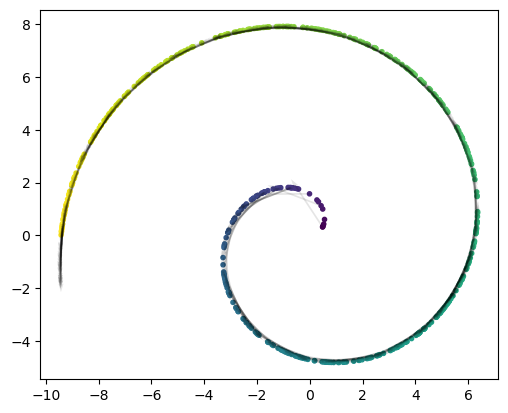

In [ ]:
X, flows, labels = directed_spiral_uniform()
plot_directed_2d(X, flows, labels)

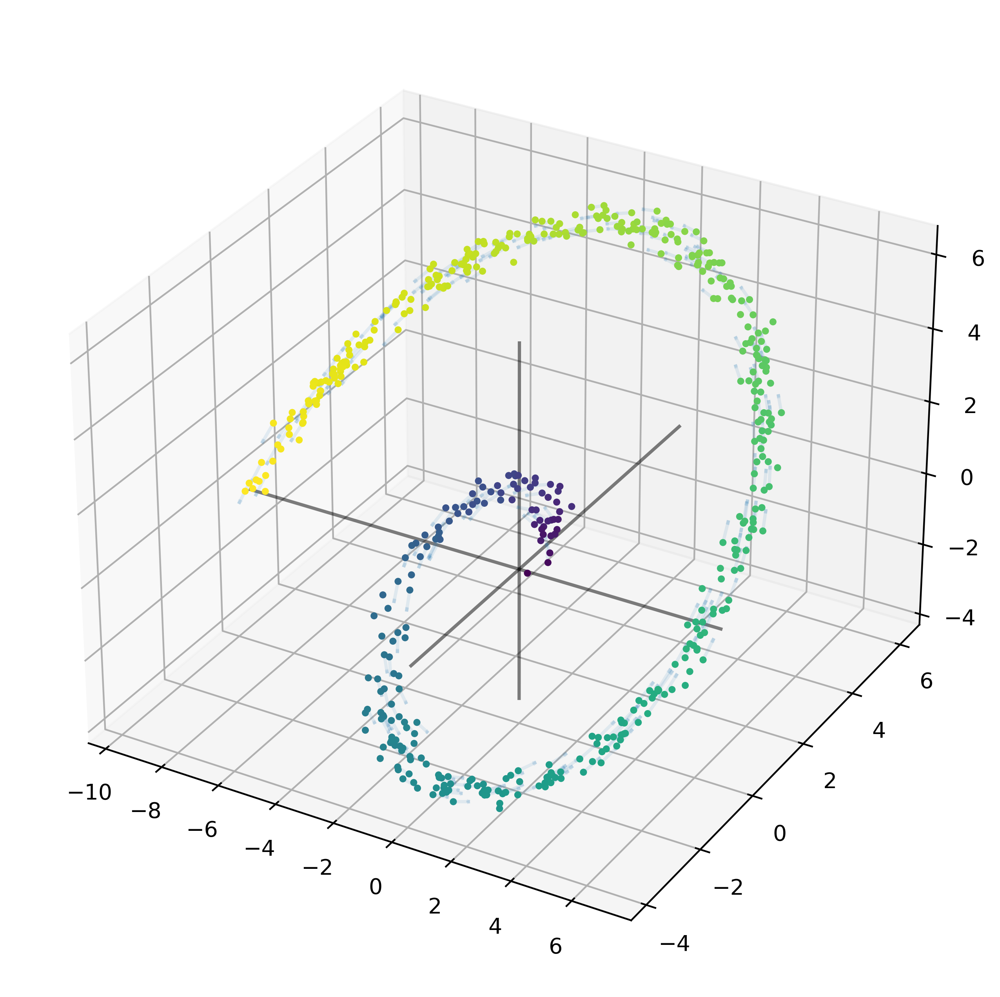

In [ ]:
X, flows, labels = directed_spiral_uniform(xtilt=np.pi/4, sigma=0.2)
plot_directed_3d(X, flows, labels, origin=True)

## Delayed Spirals

We sample $\theta$ uniformly between $\pi \times$ `num_spirals` and $3\pi \times$ `num_spirals` and calculate $x = r\theta\cos(\theta), y = r\theta\sin(\theta)$. The vector at each data point is tangent to the spiral and its length is proportional to $\theta$.

In [ ]:
#| export
def directed_spiral_delayed(num_nodes=500, num_spirals=1.5, radius=1, xtilt=0, ytilt=0, sigma=0, inverse=False):
    """
    Sample `n` data points on a spiral.
    In addition to the points, returns a "flow" vector at each point. 

    Parameters
    -----------
    num_nodes : int, default=500
        Number of data points in shape.
    num_spirals : float, default=1.5
        Number of revolution.
    radius : float, default=1
        Radius of spiral.

    xtilt : float, default=0
        Angle to rotate around the x-axis.
    ytilt : float, default=0
        Angle to rotate around the y-axis.
    sigma : float, default=0
        Amount of gaussian noise
    inverse : bool, default=False
        Whether to flip the direction of flow
    """
    # sample random angles between 0 and num_spirals * 2pi
    thetas = np.random.uniform(num_spirals*np.pi, num_spirals*3*np.pi, num_nodes)
    thetas = np.sort(thetas)
    labels = thetas
    # calculate x and y coordinates
    x = np.cos(thetas) * thetas * radius
    y = np.sin(thetas) * thetas * radius
    z = np.zeros(num_nodes)
    X = np.column_stack((x, y, z))
    # calculate the angle of the tangent
    alphas = thetas + np.pi/2
    # calculate the coordinates of the tangent
    u = np.cos(alphas) * thetas
    v = np.sin(alphas) * thetas
    w = np.zeros(num_nodes)
    flows = np.column_stack((u, v, w))
    flows = -flows if inverse else flows
    # tilt and add noise
    X, flows = xy_tilt(X, flows, xtilt, ytilt)
    X = add_noise(X, sigma)
    return X, flows, labels

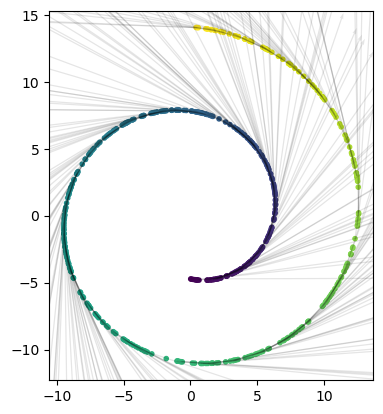

In [ ]:
X, flows, labels = directed_spiral_delayed()
plot_directed_2d(X, flows, labels)

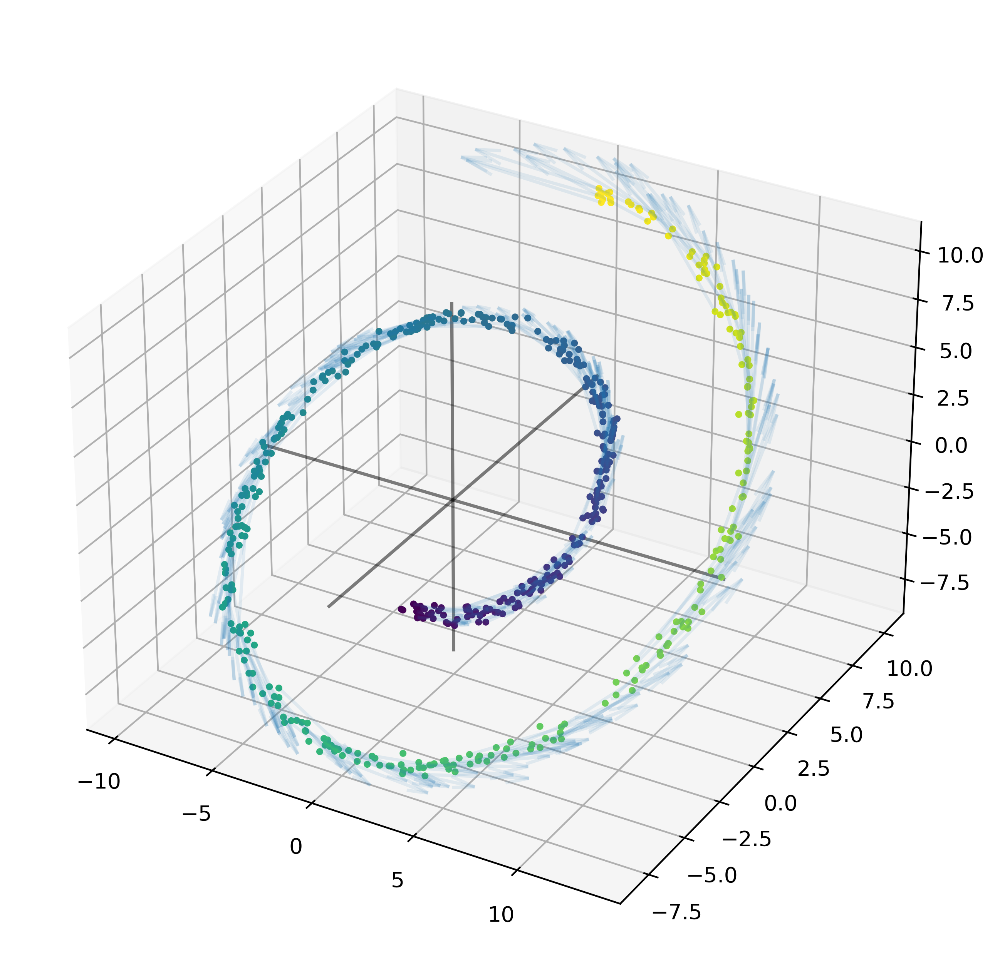

In [ ]:
# collapse
X, flows, labels = directed_spiral_delayed(xtilt=np.pi/4, sigma=0.2)
plot_directed_3d(X, flows, labels, origin=True)

# 3d Toy Manifolds

We first introduce a useful helper function that translate any 1-manifold into a 2-manifold in 3d by generating a prism.

In [ ]:
#| export
def generate_prism(num_nodes, X, height=20):
    z_noise = np.random.uniform(-height/2, height/2, num_nodes)
    X[:,2] = X[:,2] + z_noise
    return X

## Cylinders

We simply generate a prism from `directed_circle`.

In [ ]:
#| export
def directed_cylinder(num_nodes=1000, height=20, radius=1, xtilt=0, ytilt=0, sigma=0, inverse=False):
    """
    Sample `n` data points on a cylinder.
    In addition to the points, returns a "flow" vector at each point. 

    Parameters
    -----------
    num_nodes : int, default=1000
        Number of data points in shape.
    radius : float, default=1
        Radius of cylinder.
    height : float, default=20
        Height of cylinder.

    xtilt : float, default=0
        Angle to rotate around the x-axis.
    ytilt : float, default=0
        Angle to rotate around the y-axis.
    sigma : float, default=0
        Amount of gaussian noise
    inverse : bool, default=False
        Whether to flip the direction of flow
    """
    X, flows, labels = directed_circle(num_nodes, radius, xtilt, ytilt, sigma, inverse)
    X = generate_prism(num_nodes, X, height)
    return X, flows, labels

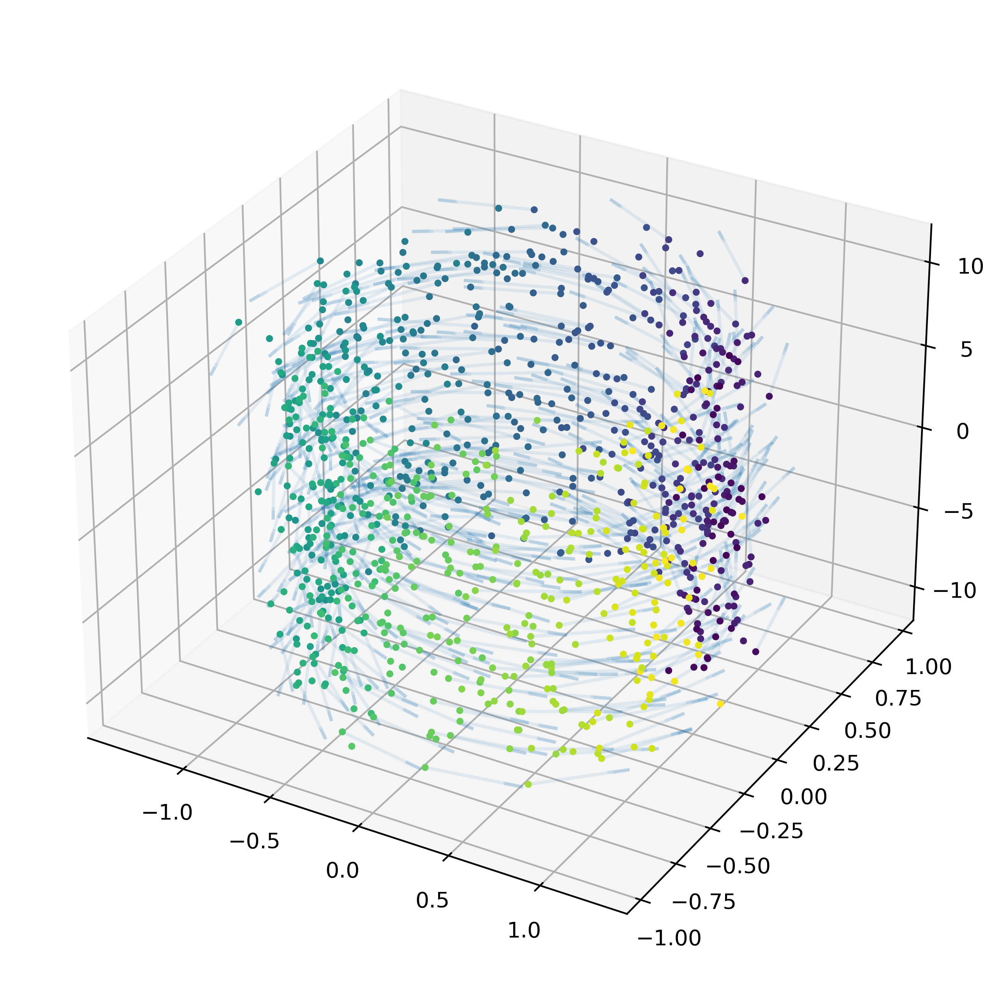

In [ ]:
X, flows, labels = directed_cylinder(xtilt=np.pi/4, sigma=0.1)
plot_directed_3d(X, flows, labels)

## Naive Swiss Rolls


We simply generate a prism from `directed_spiral`.

In [ ]:
#| export
def directed_swiss_roll(num_nodes=1000, num_spirals=1.5, height=20, radius=1, xtilt=0, ytilt=0, sigma=0, inverse=False):
    """
    Sample `n` data points on a swiss roll.
    In addition to the points, returns a "flow" vector at each point. 

    Parameters
    -----------
    num_nodes : int, default=1000
        Number of data points in shape.
    num_spirals : float, default=1.5
        Number of revolution.
    height : float, default=20
        Height of swiss roll.
    radius : float, default=1
        Radius of swiss roll.

    xtilt : float, default=0
        Angle to rotate around the x-axis.
    ytilt : float, default=0
        Angle to rotate around the y-axis.
    sigma : float, default=0
        Amount of gaussian noise
    inverse : bool, default=False
        Whether to flip the direction of flow
    """
    X, flows, labels = directed_spiral(num_nodes, num_spirals, radius, xtilt, ytilt, sigma, inverse)
    X = generate_prism(num_nodes, X, height)
    return X, flows, labels

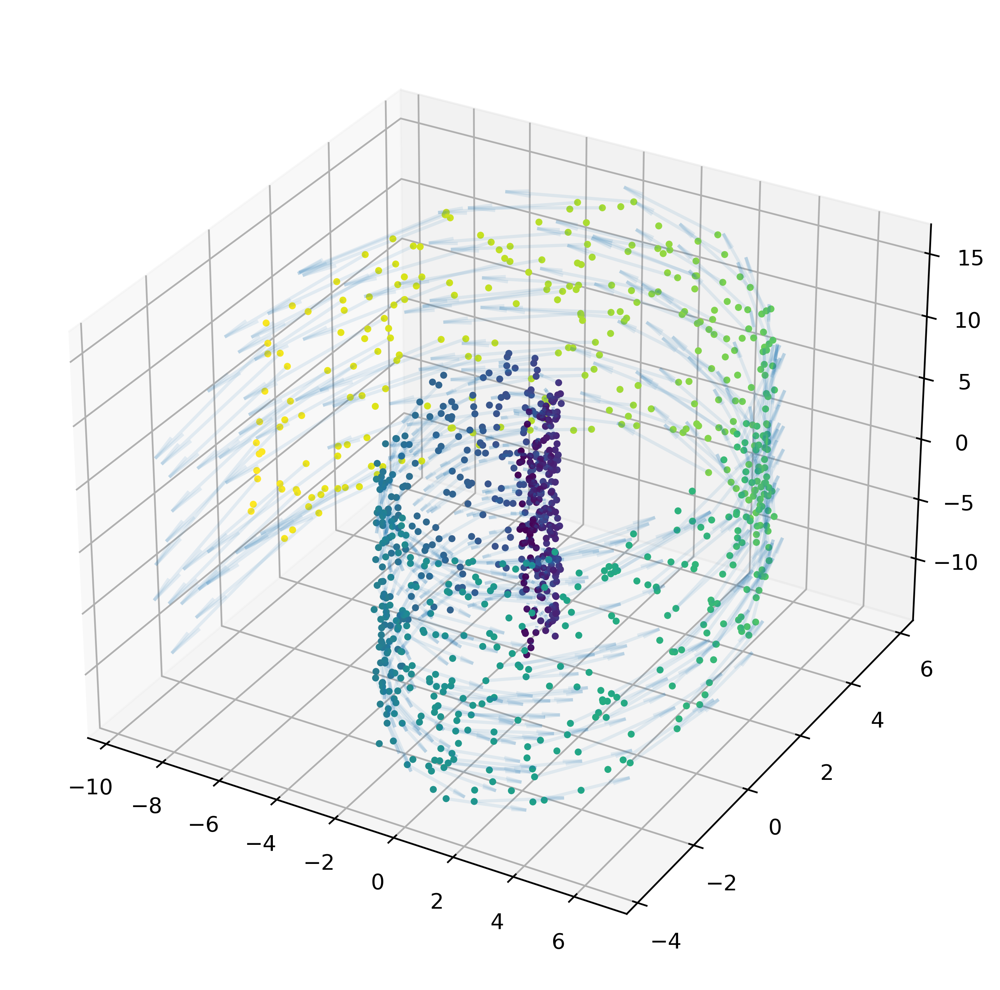

In [ ]:
# collapse
X, flows, labels = directed_swiss_roll(xtilt=np.pi/4, sigma=0.1)
plot_directed_3d(X, flows, labels)

## Uniform Spirals


We simply generate a prism from `directed_spiral_uniform`.

In [ ]:
#| export
def directed_swiss_roll_uniform(num_nodes=1000, num_spirals=1.5, height=20, radius=1, xtilt=0, ytilt=0, sigma=0, inverse=False):
    """
    Sample `n` data points on a swiss roll.
    In addition to the points, returns a "flow" vector at each point. 

    Parameters
    -----------
    num_nodes : int, default=1000
        Number of data points in shape.
    num_spirals : float, default=1.5
        Number of revolution.
    height : float, default=20
        Height of swiss roll.
    radius : float, default=1
        Radius of swiss roll.

    xtilt : float, default=0
        Angle to rotate around the x-axis.
    ytilt : float, default=0
        Angle to rotate around the y-axis.
    sigma : float, default=0
        Amount of gaussian noise
    inverse : bool, default=False
        Whether to flip the direction of flow
    """
    X, flows, labels = directed_spiral_uniform(num_nodes, num_spirals, radius, xtilt, ytilt, sigma, inverse)
    X = generate_prism(num_nodes, X, height)
    return X, flows, labels

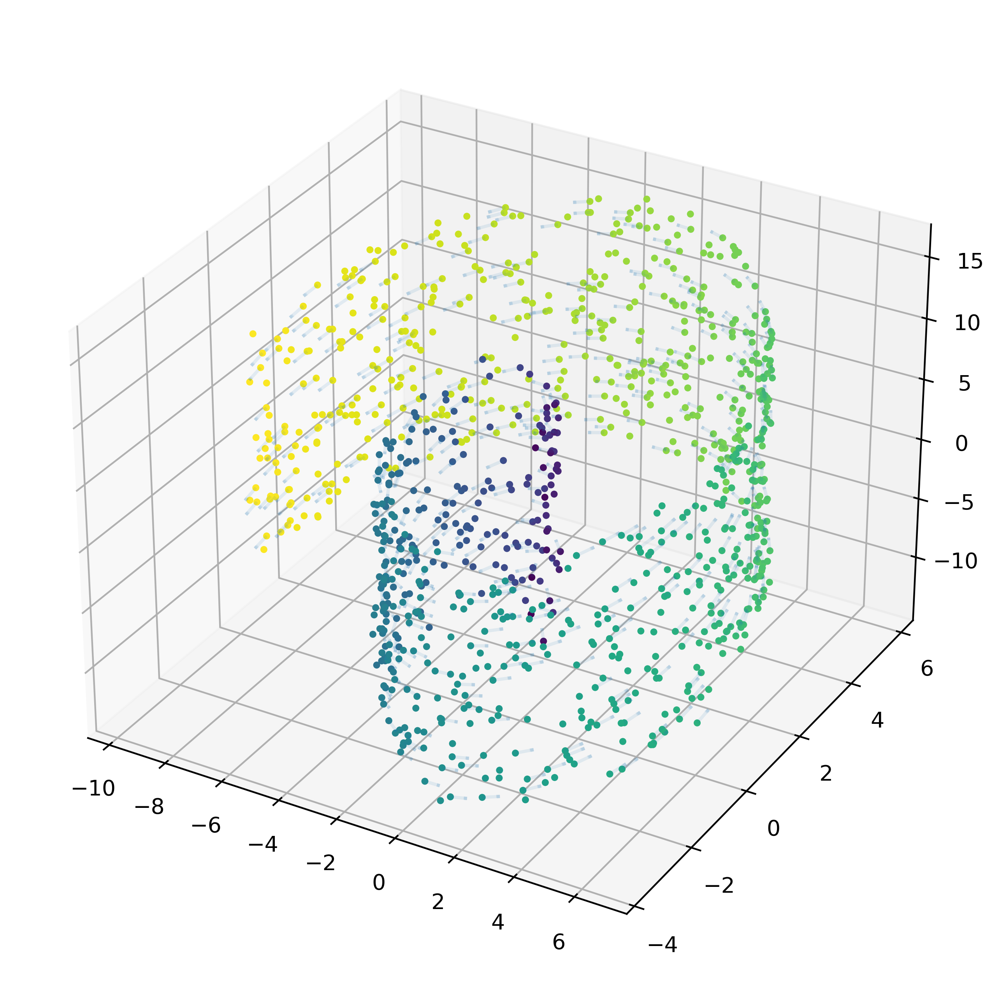

In [ ]:
X, flows, labels = directed_swiss_roll_uniform(xtilt=np.pi/4, sigma=0.1)
plot_directed_3d(X, flows, labels)

## Delayed Spirals


We simply generate a prism from `directed_spiral_delayed`.

In [ ]:
#| export
def directed_swiss_roll_delayed(num_nodes=1000, num_spirals=1.5, height=20, radius=1, xtilt=0, ytilt=0, sigma=0, inverse=False):
    """
    Sample `n` data points on a swiss roll.
    In addition to the points, returns a "flow" vector at each point. 

    Parameters
    -----------
    num_nodes : int, default=1000
        Number of data points in shape.
    num_spirals : float, default=1.5
        Number of revolution.
    height : float, default=20
        Height of swiss roll.
    radius : float, default=1
        Radius of swiss roll.

    xtilt : float, default=0
        Angle to rotate around the x-axis.
    ytilt : float, default=0
        Angle to rotate around the y-axis.
    sigma : float, default=0
        Amount of gaussian noise
    inverse : bool, default=False
        Whether to flip the direction of flow
    """
    X, flows, labels = directed_spiral_delayed(num_nodes, num_spirals, radius, xtilt, ytilt, sigma, inverse)
    X = generate_prism(num_nodes, X, height)
    return X, flows, labels

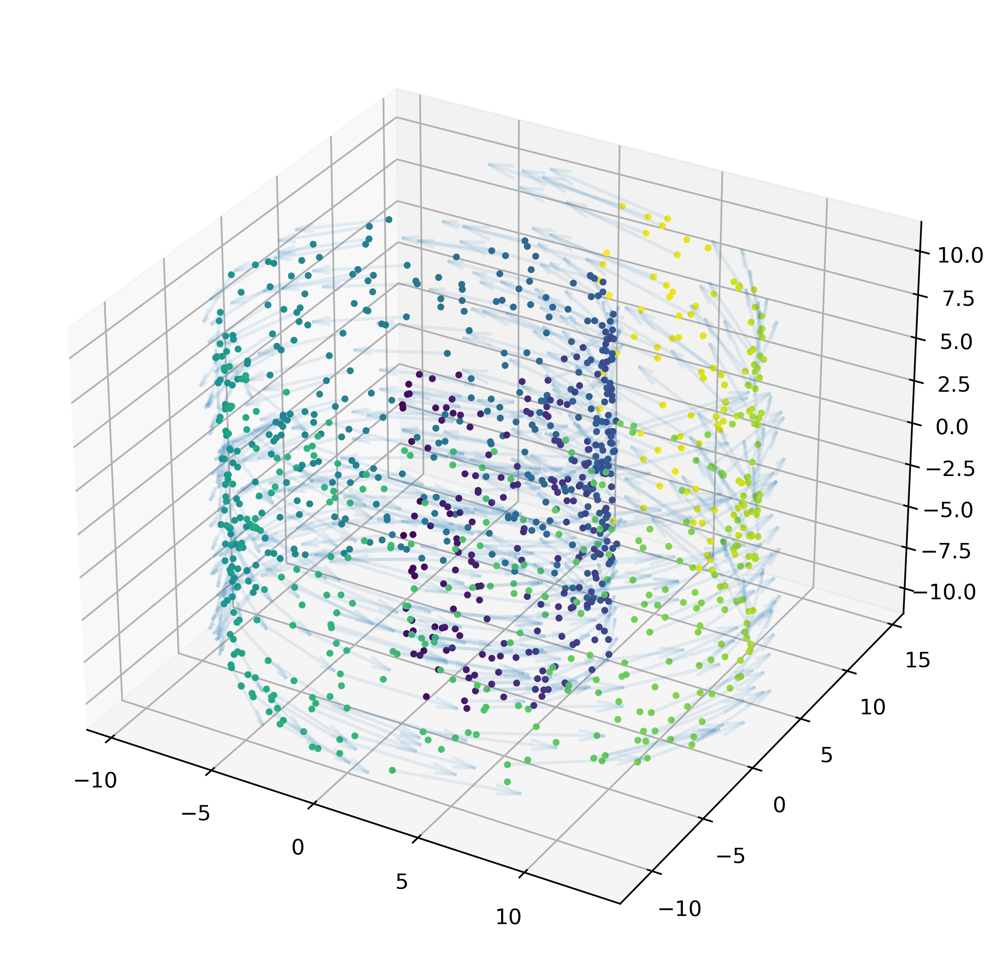

In [ ]:
X, flows, labels = directed_swiss_roll_delayed(xtilt=0, sigma=0.1)
plot_directed_3d(X, flows, labels)

# Directed Graphs from Manifolds with Flow

The above datasets sample points and flows from a number of toy manifolds. To use these with FEARFRED, we need to convert the points and flows into directed graphs. The below datasets do just this: for each batch, they sample points and flows from the manifold, and turn it into a directed graph. 

Because the points are sampled in real time, we use an `IterableDataset`.

In [ ]:
#| export
import torch
from torch.utils.data import IterableDataset, Dataset, DataLoader
import matplotlib.pyplot as plt
import torch.nn.functional as F
from FEARFRED.graph_builder import flashlight_kernel
class DirectedCircle(Dataset):
    """
    Samples directed graphs from a directed circle. Each batch has an adjacency matrix and a set of flows
    """
    def __init__(self,
                n_nodes = 128, # number of nodes per batch
                n_batches = 100 # number of batches in dataset
                ):
        self.n_nodes = n_nodes
        self.n_batches = n_batches
    def __len__(self):
        return self.n_batches
    def __getitem__(self, i):
        X, flows, labels = directed_circle(
            num_nodes = self.n_nodes
        )
        X = torch.tensor(X)
        flows = torch.tensor(flows)
        features = torch.tensor(labels)
        A = flashlight_kernel(X, flows, kernel_type='fixed',sigma=0.7)
        # threshold to top 10% of edges
        A[A<0.01] = 0
        return A, features

In [ ]:
d = DirectedCircle()
dataloader = DataLoader(d, batch_size=1)

torch.Size([128, 128])


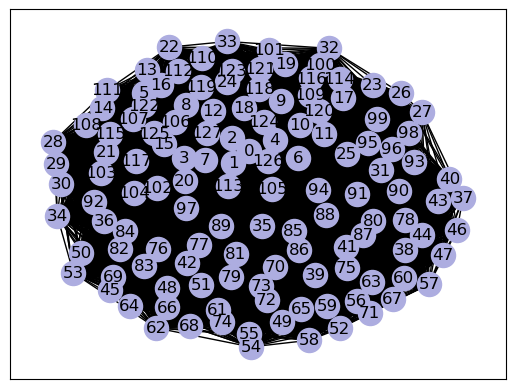

In [ ]:
from FEARFRED.plotting import visualize_graph
for data in dataloader:
    A, features = data
    A = A[0]
    print(A.shape)
    visualize_graph(A.numpy())
    break

In [ ]:
A

tensor([[0.0000, 0.5613, 0.5580,  ..., 0.0628, 0.0645, 0.0658],
        [0.0760, 0.0000, 0.3701,  ..., 0.0619, 0.0636, 0.0649],
        [0.0755, 0.1174, 0.0000,  ..., 0.0615, 0.0633, 0.0645],
        ...,
        [0.4588, 0.4516, 0.4488,  ..., 0.0000, 0.5533, 0.5420],
        [0.4731, 0.4657, 0.4629,  ..., 0.0749, 0.0000, 0.5584],
        [0.4833, 0.4757, 0.4728,  ..., 0.0734, 0.0756, 0.0000]],
       dtype=torch.float64)